<a href="https://colab.research.google.com/github/rudney5000/Hackaton_ML_Ufa/blob/main/Hackaton.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Оптимизация работы коммунальных служб 🗑️
# Optimization of public utilities 🗑️

Задача

Необходимо создать и обучить модель машинного зрения, которая поможет на основе выявления аномалий на представленных фотоснимках формировать фокусированные проблемно-ориентированные выборки, что в свою очередь позволит продуктивно организовать работу инспекторов.

Качество снимков имеет три категории:

● неудовлетворительного качества;

● с отсутствующими мусорными баками;

● соответствующие всем необходимым условиям

Task

It is necessary to create and train a machine vision model that will help to form focused problem-oriented samples based on the detection of anomalies in the presented photographs, which in turn will allow the inspectors to organize their work productively.

The quality of the images has three categories:

● unsatisfactory quality;

● with missing trash cans;

● meet all the necessary conditions

# IMPORT PACKAGES

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import cv2
import os
import gc
import glob, os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, activations, optimizers, losses, metrics, initializers
from tensorflow.keras.preprocessing import image
from sklearn.model_selection import StratifiedKFold, train_test_split
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D
from keras.applications.xception import Xception
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
from keras.models import load_model
import warnings
warnings.filterwarnings('ignore')
print(os.listdir("../"))
from collections import Counter
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset
from torchvision import datasets, models, transforms
from torchvision.models import resnet18
import shutil                                                                   # Модуль для обработки файлов, групп файлов, и папок
import time    
from keras.callbacks import EarlyStopping, ModelCheckpoint 

['tmp', 'bin', 'home', 'sys', 'etc', 'lib64', 'root', 'run', 'mnt', 'lib', 'srv', 'boot', 'var', 'media', 'usr', 'proc', 'opt', 'sbin', 'dev', 'content', '.dockerenv', 'tools', 'datalab', 'lib32', 'python-apt', 'NGC-DL-CONTAINER-LICENSE']


# IMPORT DATA

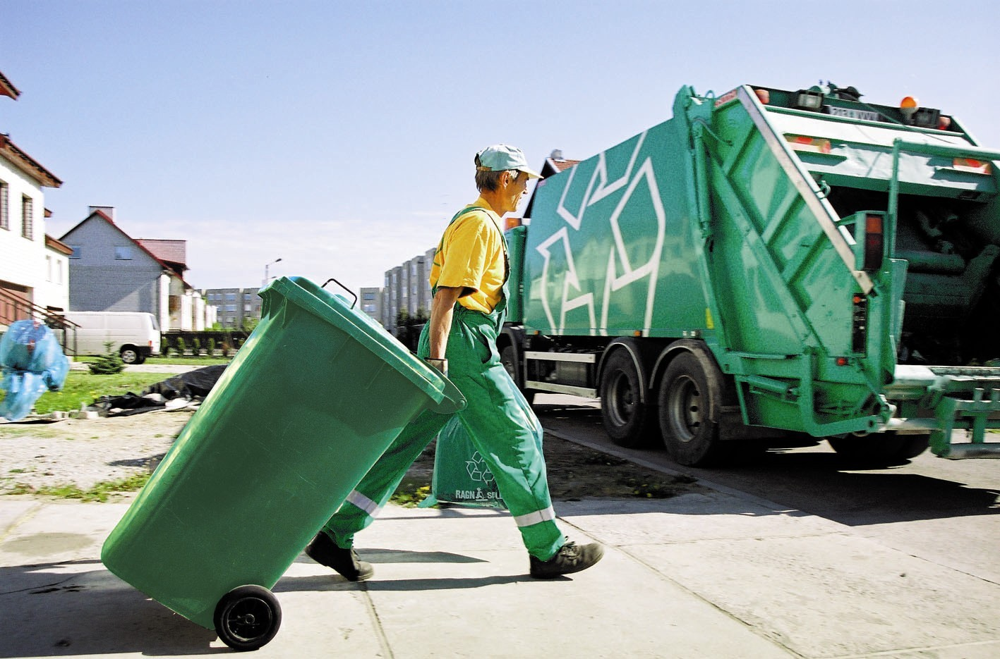

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/img.jpg")

In [ ]:
train_path = "train"
test_path="test_dataset"

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/train.csv')
data

,ID_img,class
0,220301124100_d3815192b7a85e54f935936bbe09496f.jpg,0.0
1,220301124101_c919e95934b3df93a6149764a498b11f.jpg,0.0
2,220301124110_69dcd5eb441c4df666dfedde7ac47fc6.jpg,0.0
3,220301124113_a102c632672df1b5d1e0b7a0fe7360d2.jpg,0.0
4,220301124127_d28e5d63f63b1306b75db49eecbcd3be.jpg,0.0
...,...,...
538,220307085810_d1fadc9772ff8dbe3b1904f752ea17aa.jpg,1.0
539,220307085905_484451476d4469abca1ae1b5c4cddffc.jpg,1.0
540,220307131945_1d2defc24fe3920808beaa3aae29900c.jpg,1.0
541,220307132224_52645281baa22ba7c267cccd4adc58e5.jpg,1.0


In [ ]:
sub= pd.read_csv('/content/drive/MyDrive/sample_solution.csv')
sub

,ID_img,class
0,34020749806_42065966214_42113475048_2,0
1,80128313599_98196458454_79029076007_8,0
2,17820331238_48919943775_53688855463_7,0
3,70492442702_21083599816_22777758696_0,0
4,94790217016_17108156014_60668676818_2,0
...,...,...
220,60879177998_15763718934_82574532042_2,0
221,11758169966_65799840524_72283028069_1,0
222,9259096884_2251720133_44072689872_8,0
223,37732252922_9265441355_19052721018_3,0


# DATA PREPROCESSING

# DATA EXPLORATION & VISUALISATION

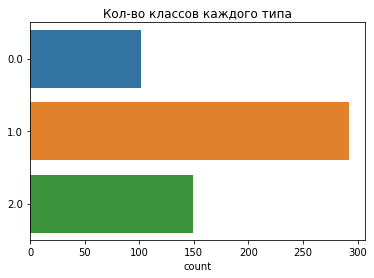

2233

In [ ]:
# Отобразим количество классов
# Let's display the number of classes
plt.title('Кол-во классов каждого типа')
sns.countplot(y=data['class'].values)
plt.show()
gc.collect()

In [ ]:
data['class'].value_counts(normalize=False)

1.0    292
2.0    149
0.0    102
Name: class, dtype: int64

In [ ]:
data['index'] = data.index# создадим колонку индекс 

In [ ]:
data_0 = data.loc[data['class']==0.0]# разобъем на 3 подмножества соостветствующим классам и посмотрим на содержимое
data_1 = data.loc[data['class']==1.0]
data_2 = data.loc[data['class']==2.0]

# Создадим функцию для загрузки

In [ ]:
def train_load(df,target_size=(224,224)):
    array = []
    for file in tqdm(df['ID_img'].values):
            img  = image.load_img(os.path.join(train_path, file), target_size=target_size)
            img = image.img_to_array(img)/255. #нормализовать значения тензора
            array.append(img)
            gc.collect()
    return np.asarray(array)

In [ ]:
train_data_0=train_load(data_0)
train_data_1=train_load(data_1)
train_data_2=train_load(data_2)

100%|██████████| 149/149 [00:34<00:00,  4.34it/s]


# Посмотрим какие изображения соотвестуют классу "0"

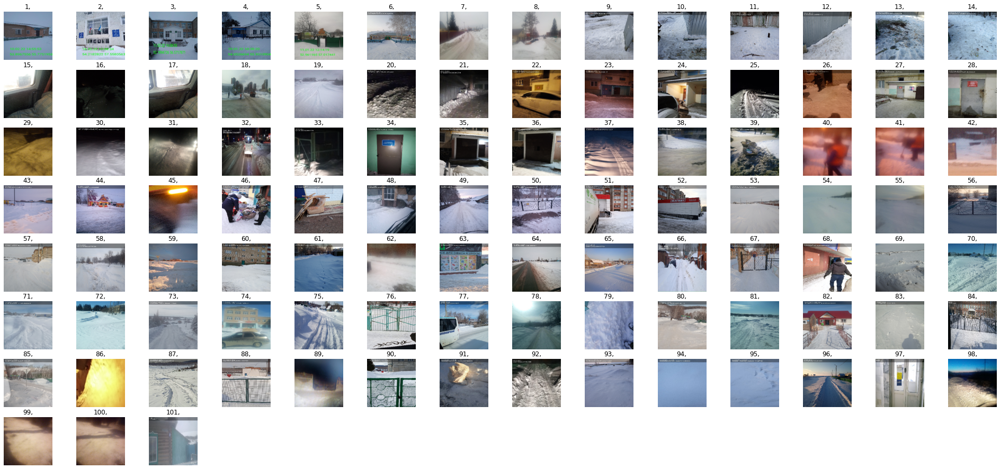

180522

In [ ]:
plt.figure(figsize=(34,58))
for i in range(1,len(data_0)):
    plt.subplot(29,14,i)
    plt.title(f'{data_0["index"].values[i]},')
    plt.imshow(train_data_0[i])
    plt.axis('off')
plt.show()
gc.collect()


Данной метке соответствуют изображения с отсутствующими мусорными баками, но очень много изображений которые неудовлетворительного качества

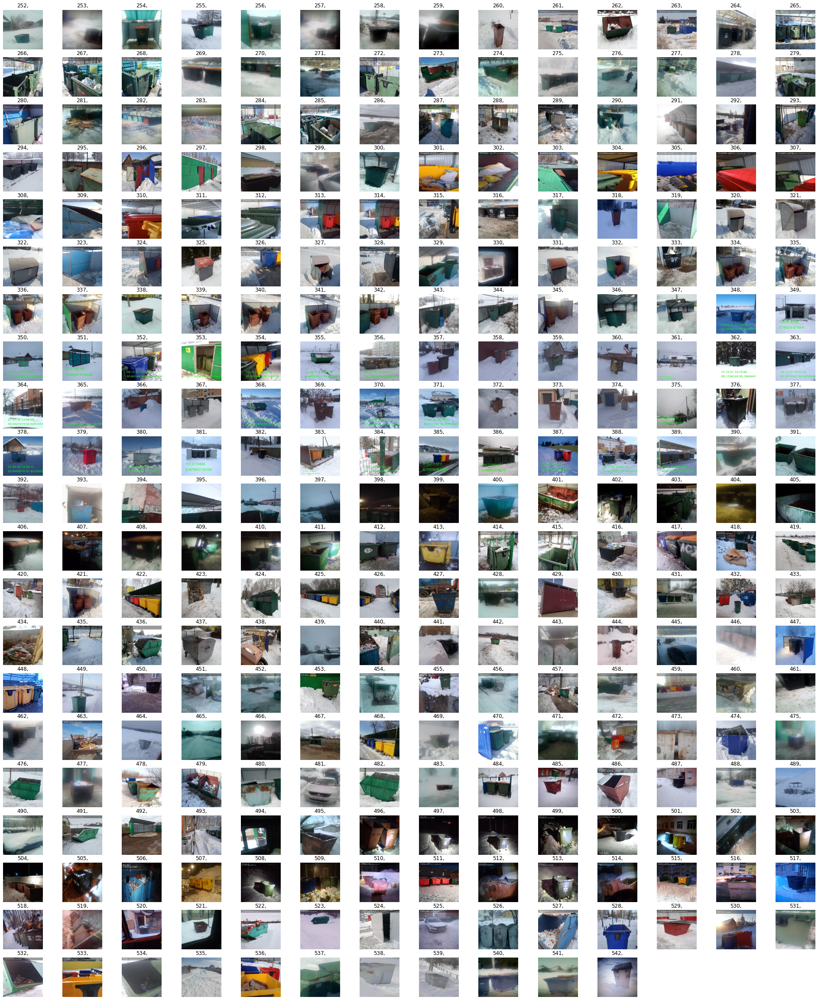

519782

In [ ]:
### Аналогично осмотрим какие изображения соотвестуют классу "1"

plt.figure(figsize=(34,58))
for i in range(1,len(data_1)):
    plt.subplot(29,14,i)
    plt.title(f'{data_1["index"].values[i]},')
    plt.imshow(train_data_1[i])
    plt.axis('off')
plt.show()
gc.collect()

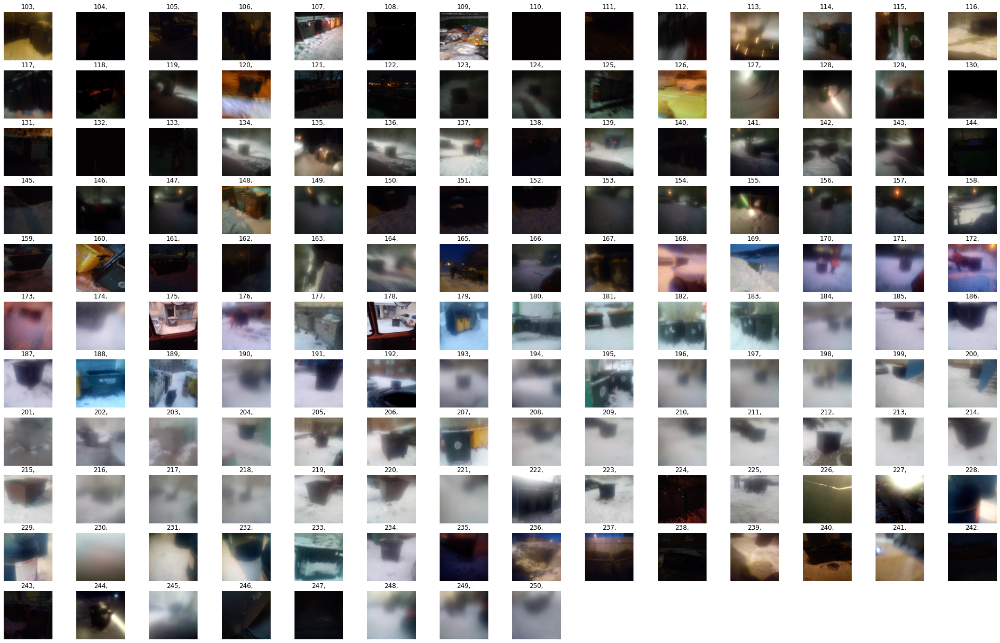

264479

In [ ]:
# Какие изображения соотвестуют классу "2"
 
plt.figure(figsize=(34,58))
for i in range(1,len(data_2)):
    plt.subplot(29,14,i)
    plt.title(f'{data_2["index"].values[i]},')
    plt.imshow(train_data_2[i])
    plt.axis('off')
plt.show()
gc.collect()

Итого мы имеем 3 класса:

● с отсутствующими мусорными баками класс "0"

● соответствующие всем необходимым условиям класс "1"

● неудовлетворительного качества  класс "2"

Очень много изображений не соответствуют своему классу. Метка класса будет заменена на соответствующую. Для этого ниже созданы списки с индексами изображений

In [ ]:
class_0=[109,271,289,308,296,297,323,363,351,424,439,435,452,465,466,474,481,490,492,494,524,535,319,361,375,429,445,418,525]#
class_1=[107,160]
class_2=[16,31,40,41,42,45,62,89,99,100,148,257,277,253,270,281,283,299,398,399,408,409,259,330,390,397,404,469,471,446,458,456,462,475,477,483,540,541,275]

In [ ]:
for i in class_0:
    data.iloc[i, data.columns.get_loc('class')] = 0.0

In [ ]:
for j in class_1:
    data.iloc[j, data.columns.get_loc('class')] = 1.0

In [ ]:
for x in class_2:
    data.iloc[x, data.columns.get_loc('class')] = 2.0

In [ ]:
data = data.drop(index=[8,445,291,305,423,454,315,394])

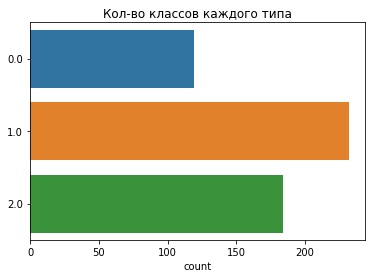

2101

In [ ]:
# Отобразим количество классов
plt.title('Кол-во классов каждого типа')
sns.countplot(y=data['class'].values)
plt.show()
gc.collect()

In [ ]:
data['class'].value_counts(normalize=False)

1.0    232
2.0    184
0.0    119
Name: class, dtype: int64

In [ ]:
labels = list(data['class'].unique())
labels

[0.0, 2.0, 1.0]

In [ ]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(dtype='int8', sparse=False)
y_train = ohe.fit_transform(data['class'].values.reshape(-1,1))

In [ ]:
def load(what='train', target_size=(224,224)):
    array = []
    if what =='train':
        for file in tqdm(data['ID_img'].values):
            img  = image.load_img(os.path.join(train_path, file), target_size=target_size)
            img = image.img_to_array(img)/255. # normalize image tensor
            array.append(img)
    elif what =='test':
        for img in os.listdir(test_path):
                img  = image.load_img(os.path.join(test_path,img), target_size=target_size)
                img =  image.img_to_array(img)/255. # normalize image tensor
                array.append(img)
    gc.collect()
    return np.asarray(array)

In [ ]:
from torch.utils.data import Dataset
class ImageDataset(Dataset):
    def __init__(self, data_df, transform=None):

        self.data_df = data_df
        self.transform = transform

    def __getitem__(self, idx):
        # достаем имя изображения и ее лейбл
        image_name, label = self.data_df.iloc[idx]['ID_img'], self.data_df.iloc[idx]['class']

        # читаем картинку. read the image
        image = cv2.imread(f"/content/drive/MyDrive/train{image_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        #print("image",image)
        # преобразуем, если нужно. transform it, if necessary
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label).long()
    
    def __len__(self):
        return len(self.data_df)                              # Выводим на экран Категорию изображения

In [ ]:
model = Xception(include_top=False, input_shape=(224,224,3))

x = GlobalAveragePooling2D()(model.output)

output = Dense(3, activation='softmax')(x)

# define new model
model = Model(model.inputs, output)


#model.summary()

In [ ]:
x_train, X_test, Y_train, y_test = train_test_split(X_train, y_train, 
                                                    stratify=y_train,
                                                    shuffle=True,
                                                    random_state=42,
                                                    test_size=0.15)

In [ ]:
print(x_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(y_test.shape)
gc.collect()

(454, 224, 224, 3)
(81, 224, 224, 3)
(454, 3)
(81, 3)


480

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=[tf.keras.metrics.AUC(from_logits=True)])

In [ ]:
history = model.fit(
    X_train,
    y_train,
    batch_size=16,
    epochs=5,
    validation_data=(X_test, y_test),
    verbose=1
)

Epoch 1/5
34/34 [==============================] - 403s 12s/step - loss: 0.6118 - auc_1: 0.9236 - val_loss: 0.3733 - val_auc_1: 0.9592
Epoch 2/5
34/34 [==============================] - 393s 12s/step - loss: 0.1412 - auc_1: 0.9963 - val_loss: 0.0835 - val_auc_1: 0.9970
Epoch 3/5
34/34 [==============================] - 393s 12s/step - loss: 0.0720 - auc_1: 0.9986 - val_loss: 0.0271 - val_auc_1: 0.9999
Epoch 4/5
34/34 [==============================] - 392s 12s/step - loss: 0.0342 - auc_1: 1.0000 - val_loss: 0.0233 - val_auc_1: 0.9999
Epoch 5/5
34/34 [==============================] - 392s 12s/step - loss: 0.0185 - auc_1: 1.0000 - val_loss: 0.0021 - val_auc_1: 1.0000


Minimum validation loss: 0.0021451769862324


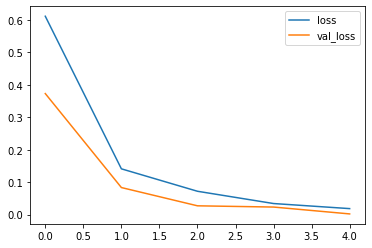

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot();
print("Minimum validation loss: {}".format(history_df['val_loss'].min()))

In [ ]:
# Загрузим Train и Test
X_train = load()
test = load('/content/ufa/test')
print(f'train dtype: {X_train.dtype}')
print(f'test dtype: {test.dtype}')
print(f'train shape: {X_train.shape}')
print(f'test shape: {test.shape}')

100%|██████████| 535/535 [00:06<00:00, 84.57it/s]


train dtype: float32
test dtype: float64
train shape: (535, 224, 224, 3)
test shape: (0,)
